# Importing required Libraries

In [31]:
import pandas as pd
from datetime import datetime
from matplotlib.pyplot import pie, axis, show
from matplotlib import pyplot as plt
import seaborn as sns
import scipy as scp
import warnings
warnings.filterwarnings('ignore')

In [32]:
Loan_raw_data= pd.read_csv("loan.csv")

# Filtering the unused columns in the dataset

In [33]:
Loan_data_filtered = Loan_raw_data.filter(items=['member_id','loan_amnt','funded_amnt','funded_amnt_inv','term','int_rate','installment','grade','sub_grade',
                                    'emp_title','emp_length','home_ownership','annual_inc','verification_status',
                                    'issue_d','loan_status','pymnt_plan','url','desc','purpose','title','zip_code',
                                    'addr_state','dti','delinq_2yrs','earliest_cr_line','inq_last_6mths',
                                    'mths_since_last_delinq','mths_since_last_record','open_acc','pub_rec','revol_bal',
                                    'revol_util','total_acc','initial_list_status','out_prncp','out_prncp_inv',
                                    'total_pymnt','total_pymnt_inv','total_rec_prncp','total_rec_int','total_rec_late_fee',
                                    'recoveries','collection_recovery_fee','last_pymnt_d','last_pymnt_amnt',
                                    'next_pymnt_d','last_credit_pull_d','collections_12_mths_ex_med','mths_since_last_major_derog','policy_code',
                                    'application_type'
])


In [34]:
Loan_data_filtered

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type
0,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,...,0.00,0.00,15-Jan,171.62,NaN,16-May,0.0,NaN,1,INDIVIDUAL
1,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,...,117.08,1.11,13-Apr,119.66,NaN,13-Sep,0.0,NaN,1,INDIVIDUAL
2,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,...,0.00,0.00,14-Jun,649.91,NaN,16-May,0.0,NaN,1,INDIVIDUAL
3,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,...,0.00,0.00,15-Jan,357.48,NaN,16-Apr,0.0,NaN,1,INDIVIDUAL
4,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,...,0.00,0.00,16-May,67.79,16-Jun,16-May,0.0,NaN,1,INDIVIDUAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39712,92174,2500,2500,1075.0,36 months,8.07%,78.42,A,A4,FiSite Research,...,0.00,0.00,10-Jul,80.90,NaN,10-Jun,NaN,NaN,1,INDIVIDUAL
39713,90607,8500,8500,875.0,36 months,10.28%,275.38,C,C1,"Squarewave Solutions, Ltd.",...,0.00,0.00,10-Jul,281.94,NaN,10-Jul,NaN,NaN,1,INDIVIDUAL
39714,90390,5000,5000,1325.0,36 months,8.07%,156.84,A,A4,NaN,...,0.00,0.00,8-Apr,0.00,NaN,7-Jun,NaN,NaN,1,INDIVIDUAL
39715,89243,5000,5000,650.0,36 months,7.43%,155.38,A,A2,NaN,...,0.00,0.00,8-Jan,0.00,NaN,7-Jun,NaN,NaN,1,INDIVIDUAL


# Finding Columns with Null values

In [35]:
Loan_data_filtered.columns[Loan_data_filtered.isnull().any()]

Index(['emp_title', 'emp_length', 'desc', 'title', 'mths_since_last_delinq',
       'mths_since_last_record', 'revol_util', 'last_pymnt_d', 'next_pymnt_d',
       'last_credit_pull_d', 'collections_12_mths_ex_med',
       'mths_since_last_major_derog'],
      dtype='object')

In [36]:
Loan_data_cleaned=Loan_data_filtered.fillna("Undefined ")

# Checking the null/NAN data in cleaned dataset

In [37]:
Loan_data_cleaned.columns[Loan_data_cleaned.isnull().any()]

Index([], dtype='object')

# Filtering to Defaulters and Current borrowers for analys

In [38]:
Loan_data =Loan_data_cleaned.query("loan_status== ['Current','Charged Off']")
Loan_data

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type
1,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,...,117.08,1.11,13-Apr,119.66,Undefined,13-Sep,0.0,Undefined,1,INDIVIDUAL
4,1311748,3000,3000,3000.0,60 months,12.69%,67.79,B,B5,University Medical Group,...,0.00,0.00,16-May,67.79,16-Jun,16-May,0.0,Undefined,1,INDIVIDUAL
8,1306957,5600,5600,5600.0,60 months,21.28%,152.39,F,F2,Undefined,...,189.06,2.09,12-Apr,152.39,Undefined,12-Aug,0.0,Undefined,1,INDIVIDUAL
9,1306721,5375,5375,5350.0,60 months,12.69%,121.45,B,B5,Starbucks,...,269.29,2.52,12-Nov,121.45,Undefined,13-Mar,0.0,Undefined,1,INDIVIDUAL
12,1298717,9000,9000,9000.0,36 months,13.49%,305.38,C,C1,Va. Dept of Conservation/Recreation,...,444.30,4.16,12-Jul,305.38,Undefined,12-Nov,0.0,Undefined,1,INDIVIDUAL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39667,118026,2500,2500,675.0,36 months,12.80%,84.00,D,D4,Nebraska Occupational Therapy,...,35.70,0.38,10-Mar,1.76,Undefined,16-May,Undefined,Undefined,1,INDIVIDUAL
39668,117783,2500,2500,825.0,36 months,9.64%,80.26,B,B4,AMZ Marketing,...,0.00,0.00,10-Mar,1.40,Undefined,16-May,Undefined,Undefined,1,INDIVIDUAL
39669,118519,6500,6500,225.0,36 months,15.01%,225.37,F,F1,Universal Advertising,...,0.00,0.00,9-Feb,225.37,Undefined,16-May,Undefined,Undefined,1,INDIVIDUAL
39678,113093,1000,1000,950.0,36 months,10.59%,32.55,C,C2,Invision Power Services,...,21.29,0.23,9-May,32.55,Undefined,9-Oct,Undefined,Undefined,1,INDIVIDUAL


# Data Type Conversions of fields in data

In [39]:
Loan_data['annual_inc'] = Loan_data['annual_inc'].astype(float)
Loan_data["int_rate"]= Loan_data["int_rate"].str.rstrip('%')
Loan_data["int_rate"] = Loan_data["int_rate"].astype(float)
Loan_data["funded_amnt"] = Loan_data["funded_amnt"].astype(float)
Loan_data["funded_amnt_inv"] = Loan_data["funded_amnt_inv"].astype(float)
Loan_data["loan_amnt"] = Loan_data["loan_amnt"].astype(float)
Loan_data['issue_d']= Loan_data['issue_d']+"-"+"24"
Loan_data['issue_d'] = Loan_data['issue_d'].apply(pd.to_datetime).dt.date
Loan_data['MYissue_d']= Loan_data['MYissue_d']= pd.DatetimeIndex(Loan_data['issue_d']).year.astype(str)+'-'+ pd.DatetimeIndex(Loan_data['issue_d']).month.astype(str)


# Univariate analysis on  Loan Status:
 % of Charged off out of total data( which includes Current ongoing loans )


<Axes: >

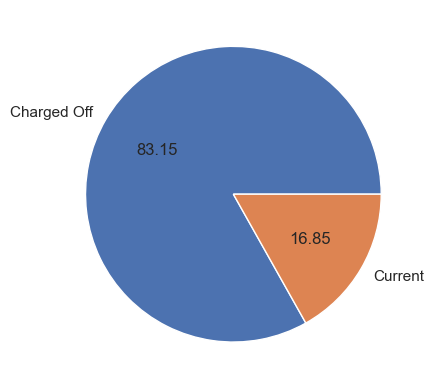

In [40]:
Loan_data.groupby('loan_status').size().plot(kind='pie', autopct='%.2f')

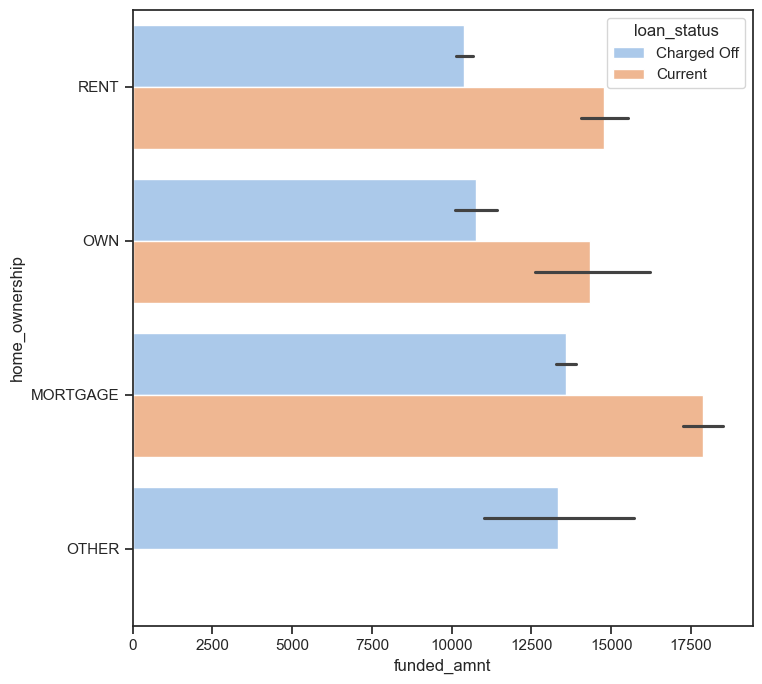

In [41]:
plt.figure(figsize=(8,8))

sns.barplot(data =Loan_data,x='funded_amnt', y='home_ownership', hue ='loan_status',palette="pastel")
plt.show()

# Filtering  Loan data to Charged off, which filters to defaulting Loan data to correlation between the variables

In [42]:
Loan_data_chargedoff = Loan_data[Loan_data['loan_status'] .str.contains("Charged Off")]
Loan_data_chargedoff

,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,...,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,MYissue_d
1,1314167,2500.0,2500.0,2500.0,60 months,15.27,59.83,C,C4,Ryder,...,1.1100,13-Apr,119.66,Undefined,13-Sep,0.0,Undefined,1,INDIVIDUAL,2024-12
8,1306957,5600.0,5600.0,5600.0,60 months,21.28,152.39,F,F2,Undefined,...,2.0900,12-Apr,152.39,Undefined,12-Aug,0.0,Undefined,1,INDIVIDUAL,2024-12
9,1306721,5375.0,5375.0,5350.0,60 months,12.69,121.45,B,B5,Starbucks,...,2.5200,12-Nov,121.45,Undefined,13-Mar,0.0,Undefined,1,INDIVIDUAL,2024-12
12,1298717,9000.0,9000.0,9000.0,36 months,13.49,305.38,C,C1,Va. Dept of Conservation/Recreation,...,4.1600,12-Jul,305.38,Undefined,12-Nov,0.0,Undefined,1,INDIVIDUAL,2024-12
14,1303503,10000.0,10000.0,10000.0,36 months,10.65,325.74,B,B2,SFMTA,...,6.3145,13-Oct,325.74,Undefined,14-Mar,0.0,Undefined,1,INDIVIDUAL,2024-12
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
39667,118026,2500.0,2500.0,675.0,36 months,12.80,84.00,D,D4,Nebraska Occupational Therapy,...,0.3800,10-Mar,1.76,Undefined,16-May,Undefined,Undefined,1,INDIVIDUAL,2024-8
39668,117783,2500.0,2500.0,825.0,36 months,9.64,80.26,B,B4,AMZ Marketing,...,0.0000,10-Mar,1.40,Undefined,16-May,Undefined,Undefined,1,INDIVIDUAL,2024-8
39669,118519,6500.0,6500.0,225.0,36 months,15.01,225.37,F,F1,Universal Advertising,...,0.0000,9-Feb,225.37,Undefined,16-May,Undefined,Undefined,1,INDIVIDUAL,2024-8
39678,113093,1000.0,1000.0,950.0,36 months,10.59,32.55,C,C2,Invision Power Services,...,0.2300,9-May,32.55,Undefined,9-Oct,Undefined,Undefined,1,INDIVIDUAL,2024-8


# Univariate analysis:

<Axes: >

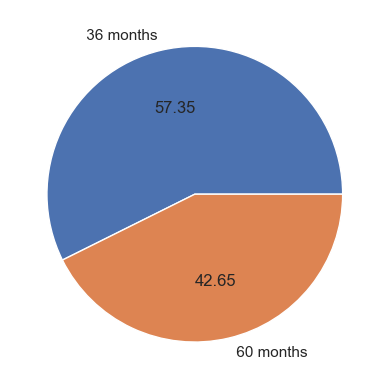

In [43]:
Loan_data_chargedoff.groupby('term').size().plot(kind='pie', autopct='%.2f')


# Correlation Map:
 Plot across all the fields in the datasource to see the correlation between them 

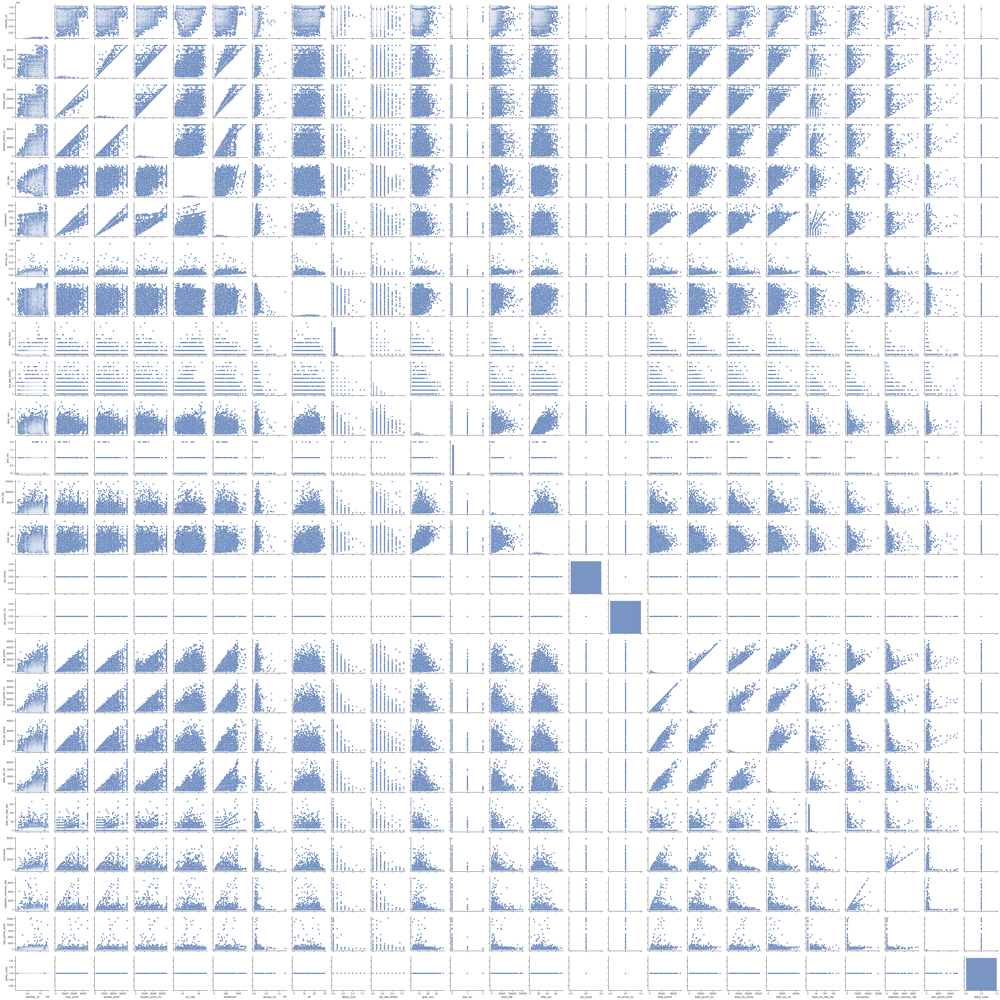

In [44]:
sns.set(style="ticks", color_codes=True)    
g = sns.pairplot(Loan_data_chargedoff)
plt.show()

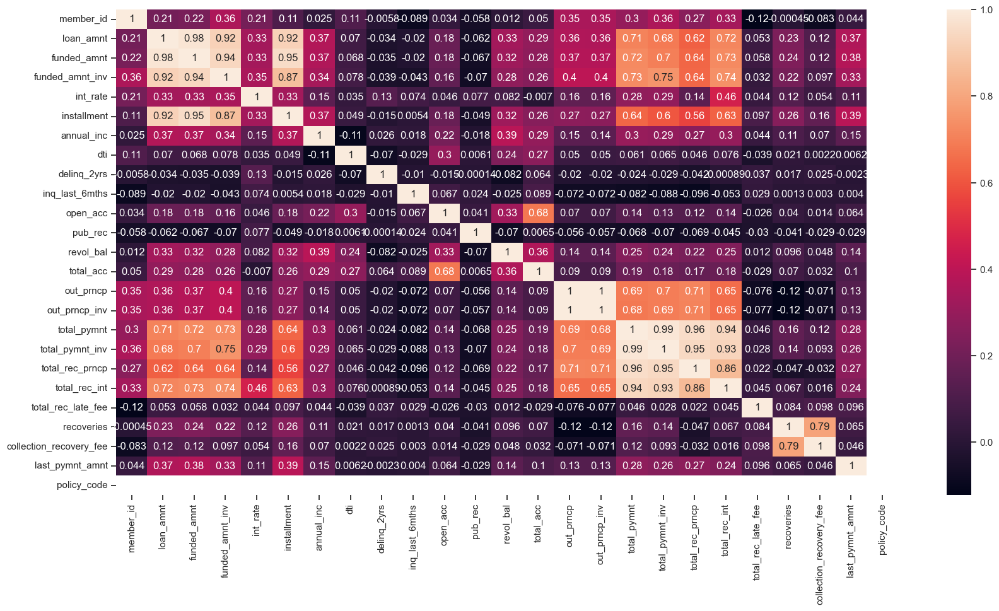

In [45]:
plt.figure(figsize=(20,10))
sns.heatmap(Loan_data.corr(),annot=True)
plt.show()

# Plotting Scatter Plot:
 Scatter plot between Annual Income vs  Funded Amount to show the correlation for Loan Defaulting

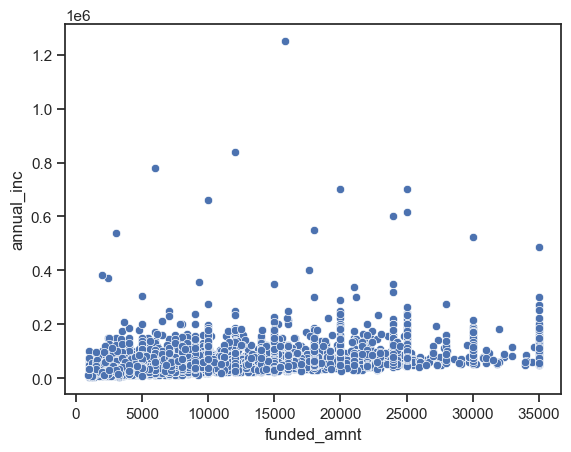

In [46]:
sns.scatterplot(x="funded_amnt", y="annual_inc",palette="pastel", data=Loan_data_chargedoff)
plt.show()

# Plotting Scatter Plot between Total Payment vs  Funded Amount to show the correlation for Loan Defaulting

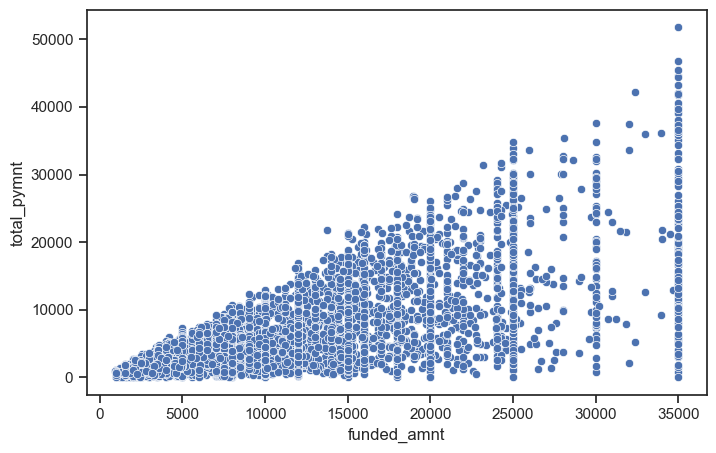

In [58]:
plt.figure(figsize=(8,5))
sns.scatterplot(x="funded_amnt", y="total_pymnt", palette="pastel",data=Loan_data_chargedoff)
plt.show()

# Creating a grouped dataset on Grade for analysis

In [48]:
Loan_data_Gradegrp = Loan_data_chargedoff.groupby(["grade"])["int_rate"].max()
Loan_data_Gradegrp = pd.DataFrame(Loan_data_Gradegrp)
Loan_data_Gradegrp

,int_rate
grade,
A,9.63
B,12.69
C,16.11
D,18.25
E,20.99
F,22.94
G,24.40


# Plotting an insight to show Interest variation across different grades

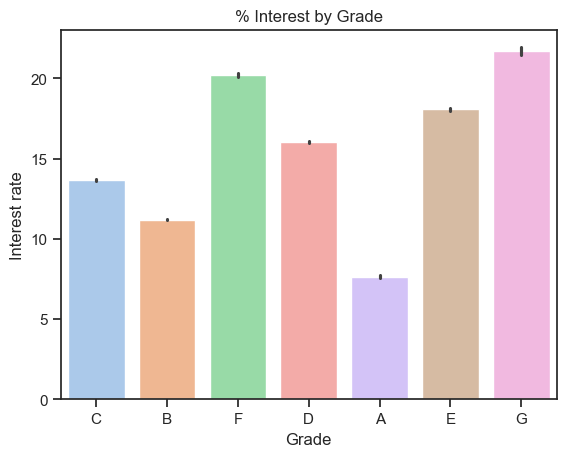

In [49]:
sns.barplot(data =Loan_data,x='grade', y='int_rate',palette="pastel")
plt.title("% Interest by Grade")
plt.xlabel("Grade")
plt.ylabel("Interest rate")
plt.show()

# Converting Funded Amount to Float datatype for aggregation and creating a grouped dataset on Grade for analysis

In [50]:
Loan_data_Emplenggrp = Loan_data_chargedoff.groupby(["emp_length"])["funded_amnt"].sum()
Loan_data_Emplenggrp = pd.DataFrame(Loan_data_Emplenggrp)
Loan_data_Emplenggrp


,funded_amnt
emp_length,
1 year,4659200.0
10+ years,18855550.0
2 years,5903175.0
3 years,6134400.0
4 years,5218650.0
5 years,5406125.0
6 years,3753600.0
7 years,3288050.0
8 years,2553825.0


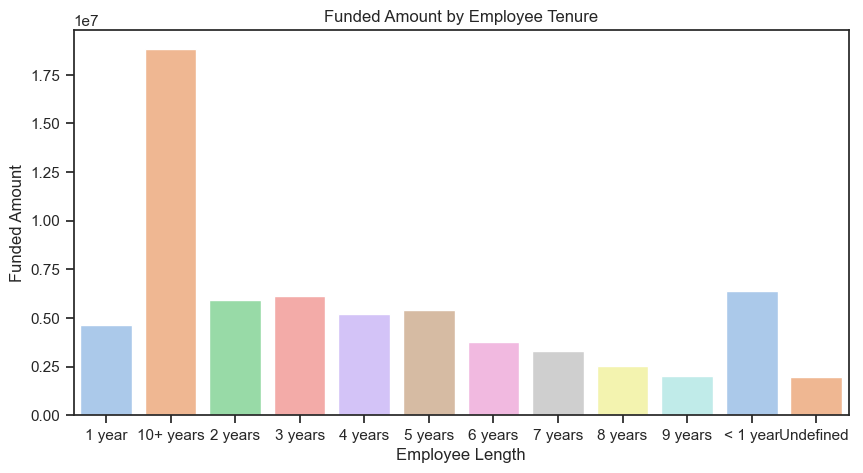

In [60]:
plt.figure(figsize=(10,5))
sns.barplot(data =Loan_data_Emplenggrp,x='emp_length', y='funded_amnt',palette="pastel")
plt.title("Funded Amount by Employee Tenure")
plt.xlabel("Employee Length")
plt.ylabel("Funded Amount")
plt.show()

# Multi Variate  Analysis
Grouping for Funded Amount,Loan Amount, Funded Amount Invested and Total payment amount by Issue Da

In [79]:
Loan_data_measgrp= Loan_data_chargedoff.groupby("MYissue_d")[["funded_amnt","loan_amnt","funded_amnt_inv","total_pymnt"]].sum()
Loan_data_measgrp
#Removing outliers
Loan_data_measgrp.drop(Loan_data_measgrp[Loan_data_measgrp["funded_amnt"] > 7000000].index, inplace=True)

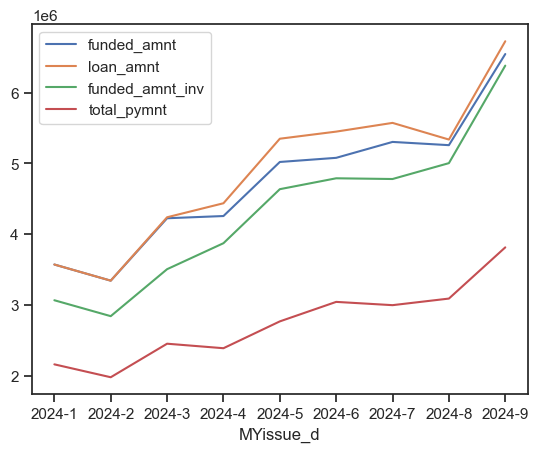

In [80]:
Loan_data_measgrp.plot.line();

# Distribution of Charged Off loans across States

<Axes: xlabel='addr_state', ylabel='count'>

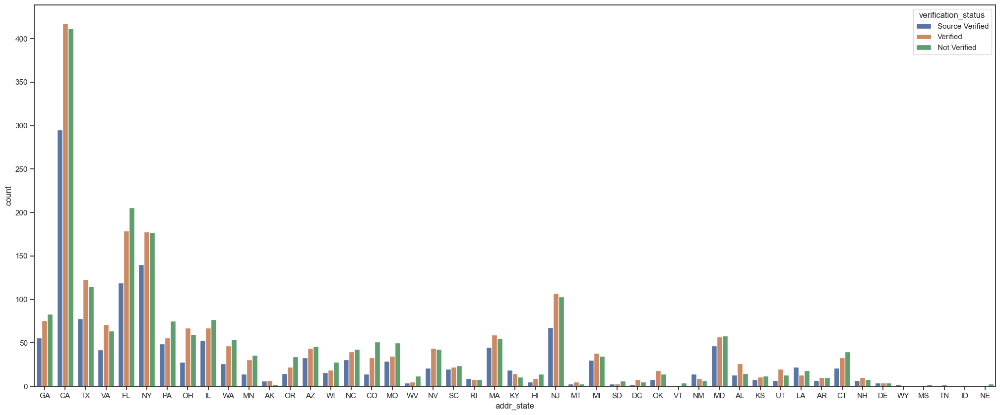

In [54]:
plt.figure(figsize=(25,10))
sns.countplot(x='addr_state', data=Loan_data_chargedoff,hue= 'verification_status')

# DTI: Debt to Income Ratio

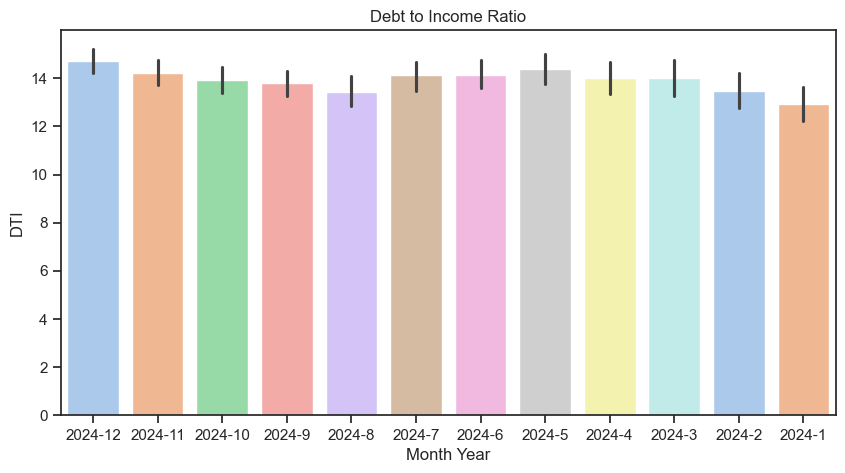

In [63]:
plt.figure(figsize=(10,5))
sns.barplot(data =Loan_data_chargedoff,x='MYissue_d', y='dti',palette="pastel")
plt.title("Debt to Income Ratio")
plt.xlabel("Month Year")
plt.ylabel("DTI")
plt.show()